In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
import re
import os
import glob

In [2]:
# define the base path for the datasets
base_path = 'drugs reac age group/canagliflozin'

# define the file pattern to match the datasets
file_pattern = os.path.join(base_path, 'canagliflozin_reac_demo_*.csv')

# get the list of file paths sorted by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# load the datasets into a list of dataframes
datasets = [pd.read_csv(file_path) for file_path in file_paths]

print(f"Loaded {len(datasets)} datasets")
print(f"First dataset sample: \n{datasets[0].head()}")

Loaded 11 datasets
First dataset sample: 
   primaryid   caseid  drug_seq role_cod       drugname  val_vbm route  \
0   93001441  9300144         1       PS  CANAGLIFLOZIN        1  ORAL   
1   93001441  9300144         2       SS  CANAGLIFLOZIN        1  ORAL   
2   92217513  9221751         1       PS  CANAGLIFLOZIN        1  ORAL   
3   92217513  9221751         2       SS  CANAGLIFLOZIN        1  ORAL   
4   92642123  9264212         1       PS  CANAGLIFLOZIN        1  ORAL   

   dose_vbm  cum_dose_chr  cum_dose_unit  ...    wt wt_cod     rept_dt  \
0       NaN           NaN            NaN  ...  77.3     KG  20130521.0   
1       NaN           NaN            NaN  ...  77.3     KG  20130521.0   
2       NaN           NaN            NaN  ...  84.5     KG  20130715.0   
3       NaN           NaN            NaN  ...  84.5     KG  20130715.0   
4       NaN           NaN            NaN  ...  90.0     KG  20130710.0   

   to_mfr  occp_cod  reporter_country occr_country  year quarter  ag

In [3]:
combined_df = pd.concat(datasets)

/var/folders/ld/dl450hd568j5wxpfd5d84y340000gn/T/ipykernel_16314/2609166978.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  combined_df = pd.concat(datasets)


In [7]:
combined_df.tail()

,primaryid,caseid,drug_seq,role_cod,drugname,val_vbm,route,dose_vbm,cum_dose_chr,cum_dose_unit,...,occr_country,year,quarter,age_group,prod_ai,drug_rec_act,auth_num,lit_ref,age_grp,sex
4342,233249091,23324909,1,PS,CANAGLIFLOZIN,1,Unknown,UNK,NaN,NaN,...,JP,2023,Q4,Elderly,CANAGLIFLOZIN,NaN,NaN,"Fujiwara H, Hara N, Hamakoji M, Takano E, Naka...",E,F
4343,233274841,23327484,2,C,CANAGLIFLOZIN,1,Unknown,take one daily,NaN,NaN,...,GB,2023,Q4,Elderly,CANAGLIFLOZIN,NaN,NaN,NaN,NaN,M
4344,233340051,23334005,2,SS,CANAGLIFLOZIN,1,Oral,300 milligram,NaN,NaN,...,CA,2023,Q4,Adult,CANAGLIFLOZIN,NaN,NaN,NaN,NaN,F
4345,233340051,23334005,2,SS,CANAGLIFLOZIN,1,Oral,300 milligram,NaN,NaN,...,CA,2023,Q4,Adult,CANAGLIFLOZIN,NaN,NaN,NaN,NaN,F
4346,233355371,23335537,2,SS,CANAGLIFLOZIN,1,NaN,NaN,NaN,NaN,...,US,2023,Q4,Adult,CANAGLIFLOZIN,NaN,NaN,"Mason T, Ansar S. Diabetic Ketoacidosis Precip...",A,F


In [8]:
stop_words = set(stopwords.words('english'))

# Preprocessing function for text data
def preprocess_text(text):
    if not isinstance(text, str):  # If the input is not a string, replace with an empty string or 'unknown'
        return ''
    # Convert text to lowercase
    text = text.lower()
    # Remove non-alphabetic characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Remove stopwords
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text


In [10]:
combined_df['preprocessed_pt'] = combined_df['pt'].apply(preprocess_text)
combined_df.dropna(subset=['pt'], inplace=True)

print(f"Preprocessed text sample from the combined_df:\n{combined_df['preprocessed_pt'].head()}")

Preprocessed text sample from the combined_df:
0    metastatic carcinoma bladder
1    metastatic carcinoma bladder
2           femoral neck fracture
3           femoral neck fracture
4            adenocarcinoma colon
Name: preprocessed_pt, dtype: object


In [11]:
reaction_texts = combined_df['preprocessed_pt'].tolist()

In [12]:
from bertopic import BERTopic

canagliflozin_topic_model = BERTopic()
topics, probs = canagliflozin_topic_model.fit_transform(reaction_texts)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [13]:
canagliflozin_topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,360,-1_symptom_intervertebral_disc_retinopathy,"[symptom, intervertebral, disc, retinopathy, p...","[intervertebral disc protrusion, intervertebra..."
1,0,557,0_asthma_sneezing__,"[asthma, sneezing, , , , , , , , ]","[asthma, asthma, asthma]"
2,1,490,1_hyperglycaemia_hypertriglyceridaemia_hyperch...,"[hyperglycaemia, hypertriglyceridaemia, hyperc...","[hyperglycaemia, hyperglycaemia, hyperglycaemia]"
3,2,474,2_type_mellitus_diabetes_fulminant,"[type, mellitus, diabetes, fulminant, , , , , , ]","[type diabetes mellitus, type diabetes mellitu..."
4,3,470,3_full_count_abnormal_blood,"[full, count, abnormal, blood, , , , , , ]","[full blood count abnormal, full blood count a..."
...,...,...,...,...,...
345,344,11,344_coronary_artery_arteriosclerosis_angioplasty,"[coronary, artery, arteriosclerosis, angioplas...","[coronary artery disease, coronary artery dise..."
346,345,11,345_attention_disturbance_social_avoidant,"[attention, disturbance, social, avoidant, beh...","[disturbance attention, disturbance attention,..."
347,346,11,346_myopathy_toxic_nephropathy_,"[myopathy, toxic, nephropathy, , , , , , , ]","[myopathy toxic, myopathy toxic, myopathy toxic]"
348,347,11,347_macular_rash_maculopapular_oedema,"[macular, rash, maculopapular, oedema, , , , ,...","[rash macular, rash macular, rash macular]"


In [14]:
canagliflozin_topic_model.get_topic(0)

[('asthma', 0.14974259011199756),
 ('sneezing', 0.013747365876082928),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05),
 ('', 1e-05)]

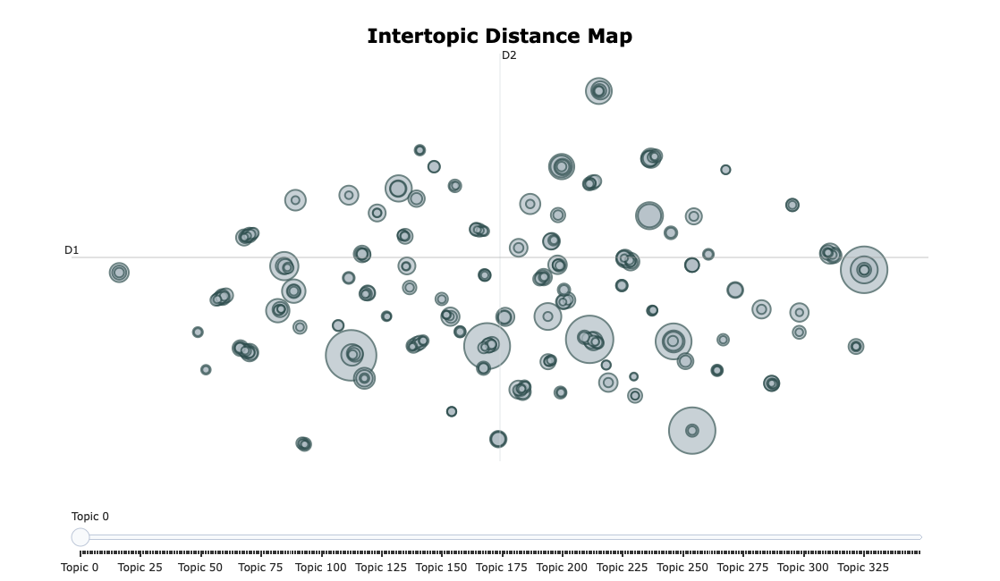

In [15]:
canagliflozin_topic_model.visualize_topics()

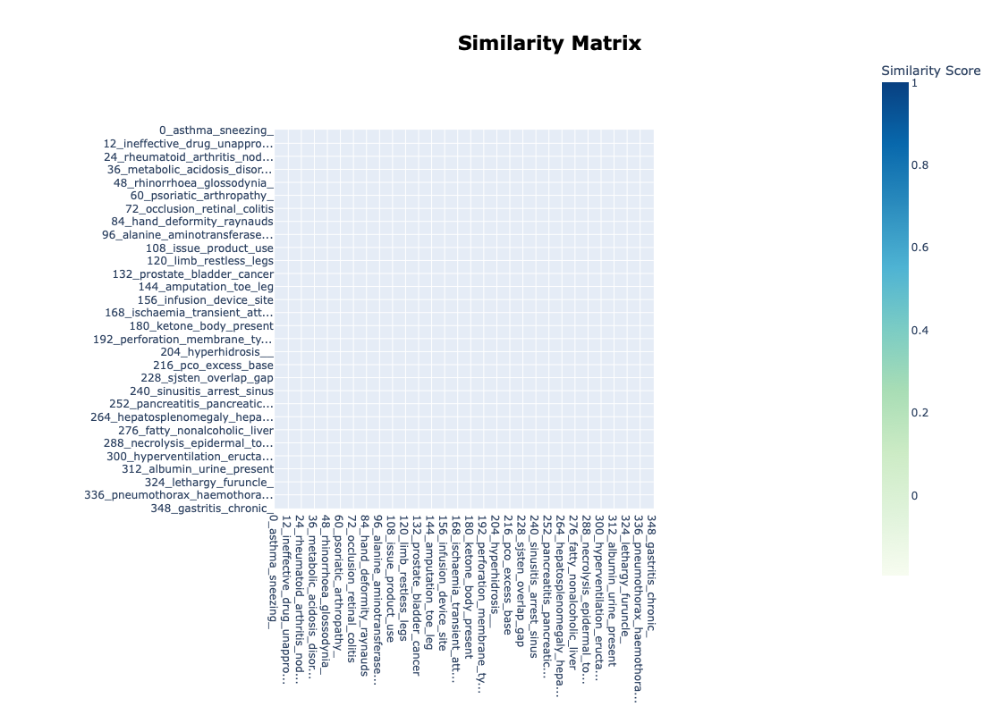

In [16]:
canagliflozin_topic_model.visualize_heatmap()